In [1]:
import sys
sys.path.append("../")

import math
import torch
import torch_geometric as pyg
import numpy as np
from models.LASE_unshared_normalized import LASE
from models.GCN import GCN
from models.RDPG_GD import RDPG_GD_Armijo, coordinate_descent
from models.SVD_truncate import embed_scipy
from torch_geometric.utils import to_dense_adj, stochastic_blockmodel_graph, erdos_renyi_graph
import matplotlib.pyplot as plt
import seaborn as sns
from training.get_init import get_x_init

# SBM-3

Loss LASE shared weights (5 layers):  tensor(61.0255)
Loss RDPG GD Armijo:  tensor(58.7728)
Armijo iterations:  35
Loss RDPG SVD Truncate:  58.788006
Loss Coordinate Gradient Descent:  58.772144


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


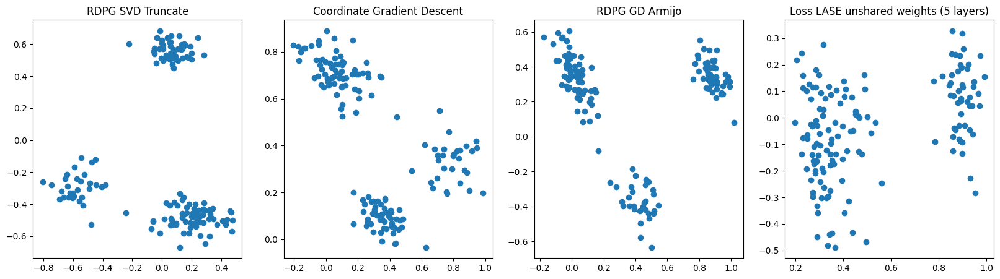

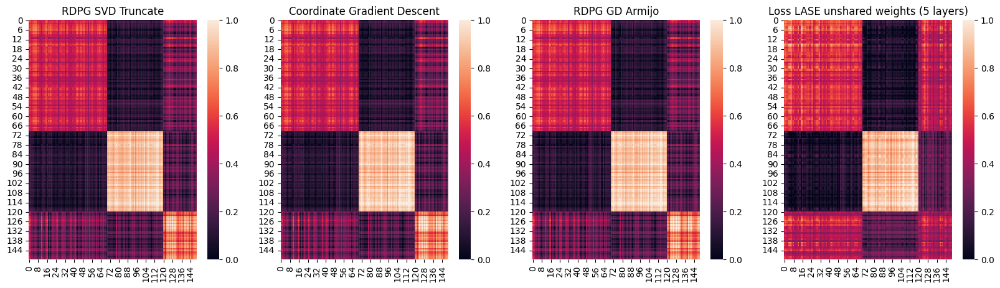

In [21]:
d = 3
gd_steps = 5
device = 'cpu'
num_nodes = 150

lase = LASE(d, d, gd_steps)
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_initx.pt'))
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_ones.pt'))
lase.to(device)
lase.eval()

n = [70, 50, 30]
p = [
     [0.5, 0.1, 0.3],
     [0.1, 0.9, 0.2], 
     [0.3, 0.2, 0.7]
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

fig, axes = plt.subplots(1, 4, figsize =(20,5))
axes[0].set_title('RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1])
axes[1].set_title(f'Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1])
axes[2].set_title('RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1])
axes[3].set_title(f'Loss LASE unshared weights ({gd_steps} layers)')
axes[3].scatter(x_lase[:,0],x_lase[:,1])
plt.show()

fig, axes = plt.subplots(1, 4, figsize =(20,5))
axes[0].set_title('RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'Loss LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

Loss LASE shared weights (5 layers):  tensor(612.1446)
Loss RDPG GD Armijo:  tensor(709.0971)
Armijo iterations:  5
Loss RDPG GD Armijo 5 steps:  tensor(709.0971)
Armijo iterations:  5
Loss RDPG SVD Truncate:  600.58856


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  600.5863


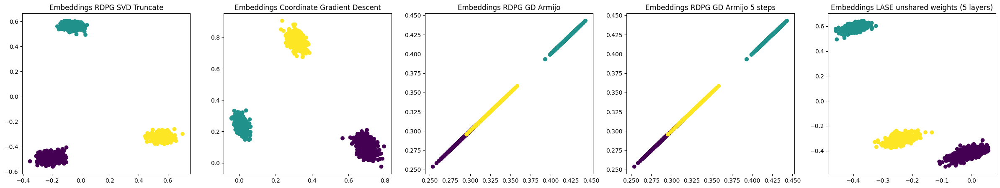

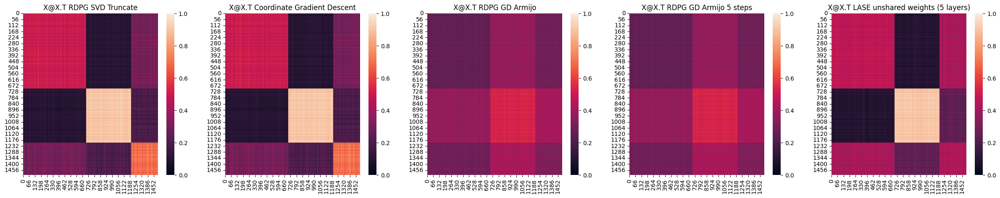

In [27]:
d = 3
gd_steps = 5
device = 'cpu'
num_nodes = 1500

lase = LASE(d, d, gd_steps)
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_initx.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand.pt'))
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_ones.pt'))
lase.to(device)
lase.eval()

n = [700, 500, 300]
p = [
     [0.5, 0.1, 0.3],
     [0.1, 0.9, 0.2], 
     [0.3, 0.2, 0.7]
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
# x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)
x = torch.ones((num_nodes, d)).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3))

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

Loss LASE shared weights (10 layers):  tensor(613.6494)
Loss RDPG GD Armijo:  tensor(600.7576)
Armijo iterations:  39
Loss RDPG GD Armijo 5 steps:  tensor(709.9301)
Armijo iterations:  5
Loss RDPG SVD Truncate:  600.75726


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)
/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  600.75604


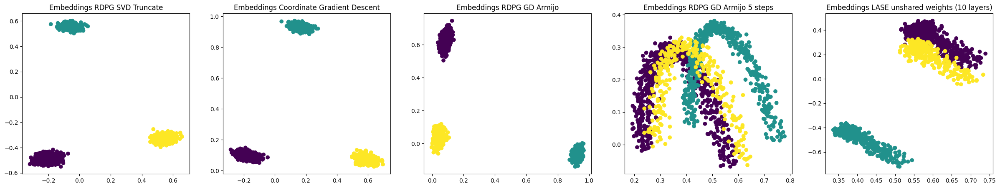

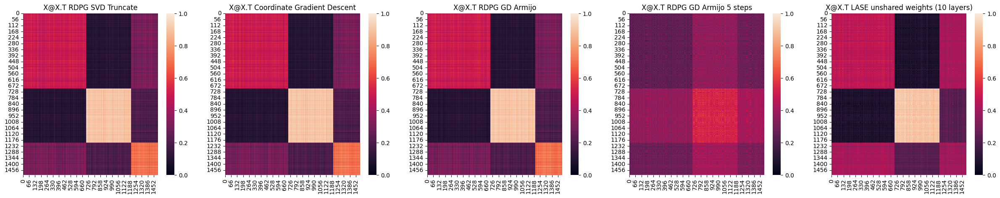

In [3]:
d = 3
gd_steps = 10
device = 'cpu'
num_nodes = 1500

lase = LASE(d, d, gd_steps)
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_initx_10steps.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_ones.pt'))
lase.to(device)
lase.eval()

n = [700, 500, 300]
p = [
     [0.5, 0.1, 0.3],
     [0.1, 0.9, 0.2], 
     [0.3, 0.2, 0.7]
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)
# x = torch.ones((num_nodes, d)).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3))

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

# Symmetric SBM-3

In [ ]:
d = 3
device = 'cpu'
num_nodes = 1500
K=3
gd_steps= 5

gcn = GCN(d, d, K)
gcn.load_state_dict(torch.load('../../saved_models/paper/gcn_d3.pt'))
gcn.to(device)
gcn.eval()


lase = GD_Unroll_w_norm(d, d, gd_steps)
lase.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d3_normalized_unbalanced.pt'))
lase.to(device)
lase.eval()


n = [700, 500, 300]

p = [
     [0.5, 0.1, 0.3],
     [0.1, 0.9, 0.2], 
     [0.3, 0.2, 0.7]
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)

x_gcn= gcn(x, edge_index)
x_gcn = x_gcn.detach()
loss = torch.norm((x_gcn@x_gcn.T - to_dense_adj(edge_index).squeeze(0)))
print(f"Loss GCN: ", loss)
x_gcn = x_gcn.to('cpu')

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)


fig, axes = plt.subplots(1, 3, figsize =(20,5))
axes[0].set_title(f'X@X.T GCN')
sns.heatmap(x_gcn@x_gcn.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE')
sns.heatmap(x_lase@x_lase.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

In [ ]:
d = 3
device = 'cpu'
num_nodes = 1500
K=3
gd_steps= 5

gcn = GCN(d, d, K)
gcn.load_state_dict(torch.load('../../saved_models/paper/gcn_d3_sim.pt'))
gcn.to(device)
gcn.eval()

lase = GD_Unroll_w_norm(d, d, gd_steps)
lase.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d3_normalized_unbalanced_sim.pt'))
lase.to(device)
lase.eval()

n = [500, 500, 500]

p = [
     [0.5, 0.1, 0.1],
     [0.1, 0.5, 0.1], 
     [0.1, 0.1, 0.5]
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)

x_gcn= gcn(x, edge_index)
x_gcn = x_gcn.detach()
loss = torch.norm((x_gcn@x_gcn.T - to_dense_adj(edge_index).squeeze(0)))
print(f"Loss GCN: ", loss)
x_gcn = x_gcn.to('cpu')

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)


colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3))

fig, axes = plt.subplots(1, 3, figsize =(20,5))
axes[0].set_title('Embeddings RDPG GCN')
axes[0].scatter(x_gcn[:,0],x_gcn[:,1], c=colors)
axes[1].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[1].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[2].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[2].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 3, figsize =(20,5))
axes[0].set_title(f'X@X.T GCN')
sns.heatmap(x_gcn@x_gcn.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE')
sns.heatmap(x_lase@x_lase.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

In [ ]:
## Random INIT 

d = 3
device = 'cpu'
num_nodes = 1500
K=3
gd_steps= 5

gcn = GCN(d, d, K)
gcn.load_state_dict(torch.load('../../saved_models/paper/gcn_d3_sim_random.pt'))
gcn.to(device)
gcn.eval()

lase = GD_Unroll_w_norm(d, d, gd_steps)
lase.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d3_normalized_unbalanced_sim_random.pt'))
lase.to(device)
lase.eval()

n = [500, 500, 500]

p = [
     [0.5, 0.1, 0.1],
     [0.1, 0.5, 0.1], 
     [0.1, 0.1, 0.5]
]

x = torch.rand((num_nodes, d)).to(device)

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

x_gcn= gcn(x, edge_index)
x_gcn = x_gcn.detach()
loss = torch.norm((x_gcn@x_gcn.T - to_dense_adj(edge_index).squeeze(0)))
print(f"Loss GCN: ", loss)
x_gcn = x_gcn.to('cpu')

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)


colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3))

fig, axes = plt.subplots(1, 3, figsize =(20,5))
axes[0].set_title('Embeddings RDPG GCN')
axes[0].scatter(x_gcn[:,0],x_gcn[:,1], c=colors)
axes[1].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[1].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[2].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[2].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 3, figsize =(20,5))
axes[0].set_title(f'X@X.T GCN')
sns.heatmap(x_gcn@x_gcn.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE')
sns.heatmap(x_lase@x_lase.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

# SBM-5

Loss LASE shared weights (5 layers):  tensor(685.3228)
Loss RDPG GD Armijo:  tensor(631.6027)
Armijo iterations:  20
Loss RDPG GD Armijo 5 steps:  tensor(775.6541)
Armijo iterations:  5
Loss RDPG SVD Truncate:  631.55927


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)
/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  631.5576


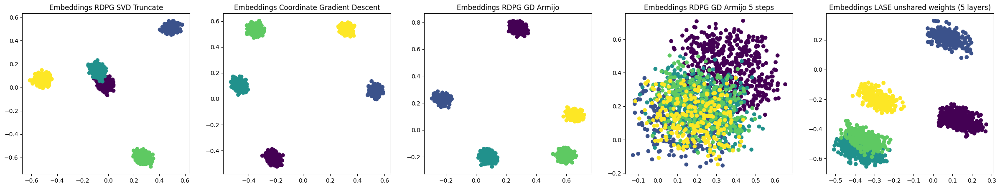

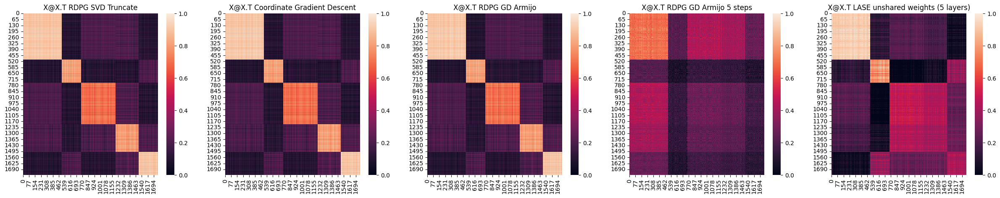

In [2]:
d = 5
gd_steps = 5
device = 'cpu'

lase = LASE(d, d, gd_steps)
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_rand.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_xinit.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_ones.pt'))
lase.to(device)
lase.eval()

num_nodes = 1750
n = [500, 250, 450, 300, 250]
p = [
    [0.9, 0.1, 0.2, 0.2, 0.1],
    [0.1, 0.8, 0.1, 0.1, 0.2],
    [0.2, 0.1, 0.7, 0.2, 0.1],
    [0.2, 0.1, 0.2, 0.8, 0.2],
    [0.1, 0.2, 0.1, 0.2, 0.9],
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

x = torch.rand((num_nodes, d)).to(device)
# x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)
# x = torch.ones((num_nodes, d)).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3,np.ones(n[3])*4,np.ones(n[4])*5))

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

Loss LASE shared weights (5 layers):  tensor(683.2462)
Loss RDPG GD Armijo:  tensor(631.3045)
Armijo iterations:  25
Loss RDPG GD Armijo 5 steps:  tensor(776.2255)
Armijo iterations:  5
Loss RDPG SVD Truncate:  631.30457


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  631.30273


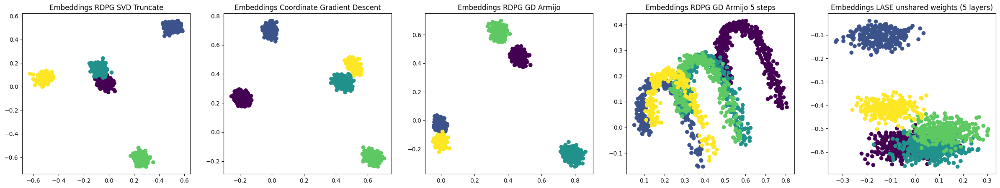

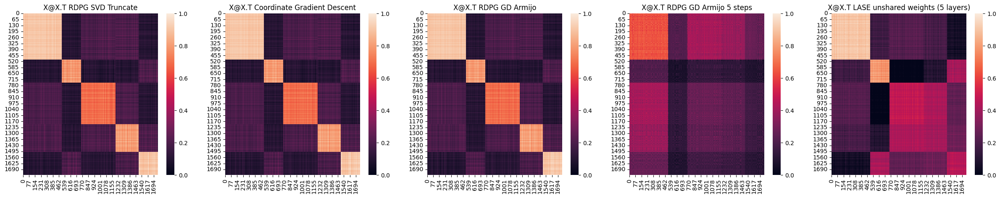

In [3]:
d = 5
gd_steps = 5
device = 'cpu'

lase = LASE(d, d, gd_steps)
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_rand.pt'))
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_xinit.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_ones.pt'))
lase.to(device)
lase.eval()

num_nodes = 1750
n = [500, 250, 450, 300, 250]
p = [
    [0.9, 0.1, 0.2, 0.2, 0.1],
    [0.1, 0.8, 0.1, 0.1, 0.2],
    [0.2, 0.1, 0.7, 0.2, 0.1],
    [0.2, 0.1, 0.2, 0.8, 0.2],
    [0.1, 0.2, 0.1, 0.2, 0.9],
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)
# x = torch.ones((num_nodes, d)).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3,np.ones(n[3])*4,np.ones(n[4])*5))

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

Loss LASE shared weights (5 layers):  tensor(1168.7188)
Loss RDPG GD Armijo:  tensor(776.0085)
Armijo iterations:  5
Loss RDPG GD Armijo 5 steps:  tensor(776.0085)
Armijo iterations:  5
Loss RDPG SVD Truncate:  631.62854


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  631.62646


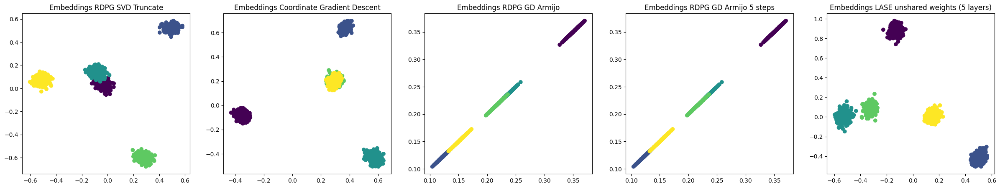

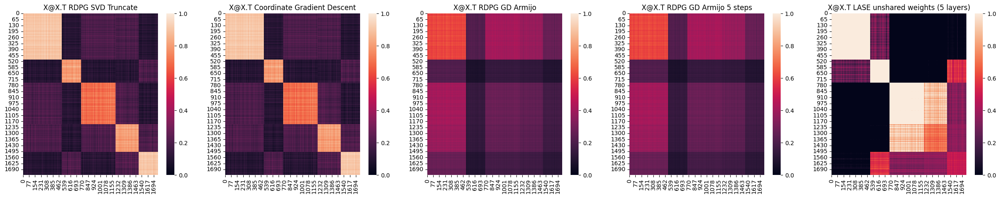

In [4]:
d = 5
gd_steps = 5
device = 'cpu'

lase = LASE(d, d, gd_steps)
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_rand.pt'))
# lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_xinit.pt'))
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d5_normalized_unbalanced_ones.pt'))
lase.to(device)
lase.eval()

num_nodes = 1750
n = [500, 250, 450, 300, 250]
p = [
    [0.9, 0.1, 0.2, 0.2, 0.1],
    [0.1, 0.8, 0.1, 0.1, 0.2],
    [0.2, 0.1, 0.7, 0.2, 0.1],
    [0.2, 0.1, 0.2, 0.8, 0.2],
    [0.1, 0.2, 0.1, 0.2, 0.9],
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
# x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)
x = torch.ones((num_nodes, d)).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3,np.ones(n[3])*4,np.ones(n[4])*5))

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

# SBM-10

Loss LASE shared weights (5 layers):  tensor(1083.0026)
Loss RDPG GD Armijo:  tensor(1022.8699)
Armijo iterations:  24
Loss RDPG GD Armijo 5 steps:  tensor(1155.9086)
Armijo iterations:  5
Loss RDPG SVD Truncate:  1015.2583


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)
/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  1015.2632


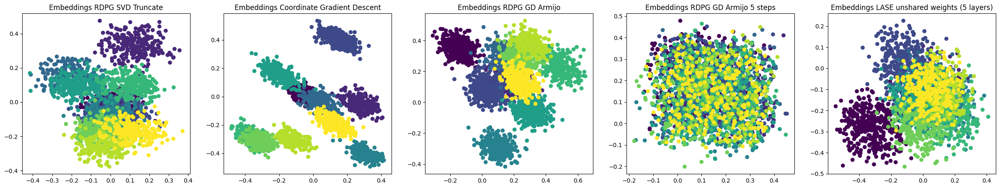

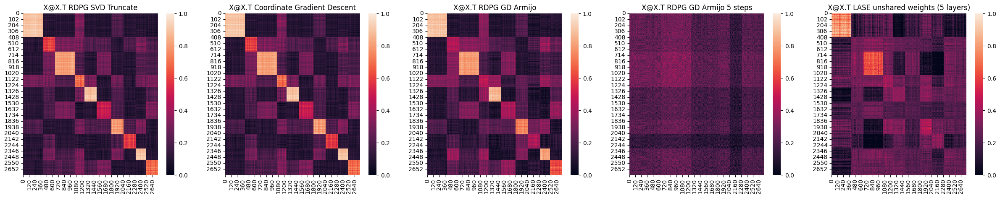

In [2]:
d = 10
gd_steps = 5
device = 'cpu'

lase = LASE(d, d, gd_steps)
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d10_normalized_unbalanced_rand.pt'))
lase.to(device)
lase.eval()

num_nodes = 2750
n = [400, 250, 400, 200, 250, 300, 250, 250, 200, 250]
p = [
    [0.9, 0.1, 0.1, 0.3, 0.1, 0.1, 0.2, 0.1, 0.1, 0.1],
    [0.1, 0.6, 0.3, 0.3, 0.2, 0.2, 0.1, 0.2, 0.3, 0.2],
    [0.1, 0.3, 0.8, 0.2, 0.1, 0.3, 0.1, 0.1, 0.2, 0.2],
    [0.3, 0.3, 0.2, 0.7, 0.3, 0.1, 0.3, 0.1, 0.3, 0.3],
    [0.1, 0.2, 0.1, 0.3, 0.9, 0.1, 0.2, 0.1, 0.1, 0.2],
    [0.1, 0.2, 0.3, 0.1, 0.1, 0.5, 0.2, 0.1, 0.1, 0.3],
    [0.2, 0.1, 0.1, 0.3, 0.2, 0.2, 0.8, 0.2, 0.3, 0.1],
    [0.1, 0.2, 0.1, 0.1, 0.1, 0.1, 0.2, 0.6, 0.1, 0.1],
    [0.1, 0.3, 0.2, 0.3, 0.1, 0.1, 0.3, 0.1, 0.9, 0.1],
    [0.1, 0.2, 0.2, 0.3, 0.2, 0.3, 0.1, 0.1, 0.1, 0.7],  
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

x = torch.rand((num_nodes, d)).to(device)
# x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3,np.ones(n[3])*4,np.ones(n[4])*5,np.ones(n[5])*6,np.ones(n[6])*7,np.ones(n[7])*8,np.ones(n[8])*9,np.ones(n[9])*10))


fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

Loss LASE shared weights (5 layers):  tensor(1088.8973)
Loss RDPG GD Armijo:  tensor(1022.0613)
Armijo iterations:  42
Loss RDPG GD Armijo 5 steps:  tensor(1151.0994)
Armijo iterations:  5
Loss RDPG SVD Truncate:  1014.38727


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  1014.38745


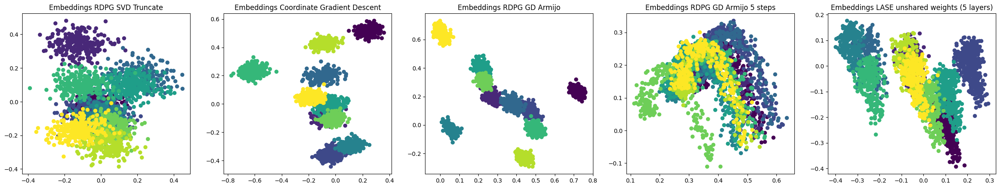

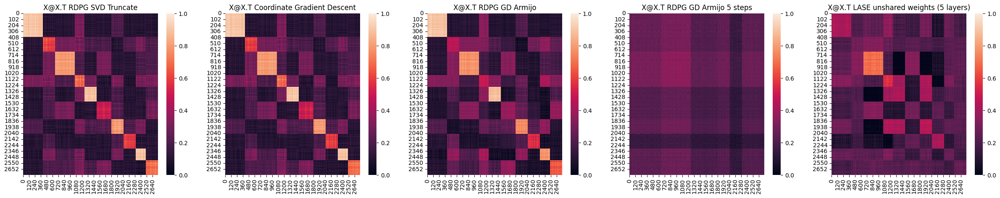

In [3]:
d = 10
gd_steps = 5
device = 'cpu'

lase = LASE(d, d, gd_steps)
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d10_normalized_unbalanced_initx.pt'))
lase.to(device)
lase.eval()

num_nodes = 2750
n = [400, 250, 400, 200, 250, 300, 250, 250, 200, 250]
p = [
    [0.9, 0.1, 0.1, 0.3, 0.1, 0.1, 0.2, 0.1, 0.1, 0.1],
    [0.1, 0.6, 0.3, 0.3, 0.2, 0.2, 0.1, 0.2, 0.3, 0.2],
    [0.1, 0.3, 0.8, 0.2, 0.1, 0.3, 0.1, 0.1, 0.2, 0.2],
    [0.3, 0.3, 0.2, 0.7, 0.3, 0.1, 0.3, 0.1, 0.3, 0.3],
    [0.1, 0.2, 0.1, 0.3, 0.9, 0.1, 0.2, 0.1, 0.1, 0.2],
    [0.1, 0.2, 0.3, 0.1, 0.1, 0.5, 0.2, 0.1, 0.1, 0.3],
    [0.2, 0.1, 0.1, 0.3, 0.2, 0.2, 0.8, 0.2, 0.3, 0.1],
    [0.1, 0.2, 0.1, 0.1, 0.1, 0.1, 0.2, 0.6, 0.1, 0.1],
    [0.1, 0.3, 0.2, 0.3, 0.1, 0.1, 0.3, 0.1, 0.9, 0.1],
    [0.1, 0.2, 0.2, 0.3, 0.2, 0.3, 0.1, 0.1, 0.1, 0.7],  
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3,np.ones(n[3])*4,np.ones(n[4])*5,np.ones(n[5])*6,np.ones(n[6])*7,np.ones(n[7])*8,np.ones(n[8])*9,np.ones(n[9])*10))


fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

Loss LASE shared weights (10 layers):  tensor(1102.5260)
Loss RDPG GD Armijo:  tensor(1015.6097)
Armijo iterations:  82
Loss RDPG GD Armijo 5 steps:  tensor(1150.6052)
Armijo iterations:  5
Loss RDPG SVD Truncate:  1014.53796


/home/sofia/lase/repo2/LASE/notebooks/../models/RDPG_GD.py:102: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X[i,:] = torch.tensor(solve_linear_system(R,(A[i,:]@X).T,X[i,:]), device=device)


Loss Coordinate Gradient Descent:  1014.5393


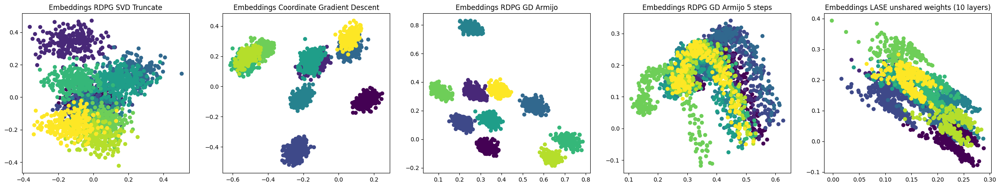

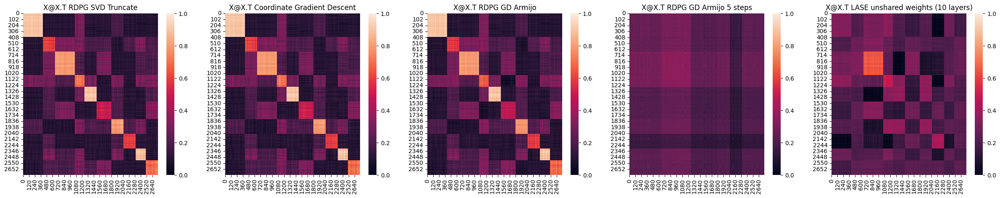

In [4]:
d = 10
gd_steps = 10
device = 'cpu'

lase = LASE(d, d, gd_steps)
lase.load_state_dict(torch.load('../saved_models/lase_unshared_d10_normalized_unbalanced_initx_10steps.pt'))
lase.to(device)
lase.eval()

num_nodes = 2750
n = [400, 250, 400, 200, 250, 300, 250, 250, 200, 250]
p = [
    [0.9, 0.1, 0.1, 0.3, 0.1, 0.1, 0.2, 0.1, 0.1, 0.1],
    [0.1, 0.6, 0.3, 0.3, 0.2, 0.2, 0.1, 0.2, 0.3, 0.2],
    [0.1, 0.3, 0.8, 0.2, 0.1, 0.3, 0.1, 0.1, 0.2, 0.2],
    [0.3, 0.3, 0.2, 0.7, 0.3, 0.1, 0.3, 0.1, 0.3, 0.3],
    [0.1, 0.2, 0.1, 0.3, 0.9, 0.1, 0.2, 0.1, 0.1, 0.2],
    [0.1, 0.2, 0.3, 0.1, 0.1, 0.5, 0.2, 0.1, 0.1, 0.3],
    [0.2, 0.1, 0.1, 0.3, 0.2, 0.2, 0.8, 0.2, 0.3, 0.1],
    [0.1, 0.2, 0.1, 0.1, 0.1, 0.1, 0.2, 0.6, 0.1, 0.1],
    [0.1, 0.3, 0.2, 0.3, 0.1, 0.1, 0.3, 0.1, 0.9, 0.1],
    [0.1, 0.2, 0.2, 0.3, 0.2, 0.3, 0.1, 0.1, 0.1, 0.7],  
]

edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)

# x = torch.rand((num_nodes, d)).to(device)
x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)

x_lase = lase(x, edge_index, edge_index_2, mask)
x_lase = x_lase.detach()
loss = torch.norm((x_lase@x_lase.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers): ", loss)
x_lase = x_lase.to('cpu')

x_gd, cost_gd, iter = RDPG_GD_Armijo(x, edge_index, mask)
x_gd = x_gd.to('cpu')
loss = torch.norm((x_gd@x_gd.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo: ", loss)
print("Armijo iterations: ", iter)

x_gd_5, cost_gd_5, iter = RDPG_GD_Armijo(x, edge_index, mask, max_iter=5)
x_gd_5 = x_gd_5.to('cpu')
loss = torch.norm((x_gd_5@x_gd_5.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print("Loss RDPG GD Armijo 5 steps: ", loss)
print("Armijo iterations: ", iter)

x_svd = embed_scipy(edge_index,d)
loss = np.linalg.norm((x_svd@x_svd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss RDPG SVD Truncate: ", loss)

x_cgd = coordinate_descent(edge_index, mask, d)
loss = np.linalg.norm((x_cgd@x_cgd.T - to_dense_adj(edge_index).squeeze(0).numpy())*to_dense_adj(mask).squeeze(0))
print("Loss Coordinate Gradient Descent: ", loss)

colors = np.concatenate((np.ones(n[0]),np.ones(n[1])*2,np.ones(n[2])*3,np.ones(n[3])*4,np.ones(n[4])*5,np.ones(n[5])*6,np.ones(n[6])*7,np.ones(n[7])*8,np.ones(n[8])*9,np.ones(n[9])*10))


fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('Embeddings RDPG SVD Truncate')
axes[0].scatter(x_svd[:,0],x_svd[:,1], c=colors)
axes[1].set_title(f'Embeddings Coordinate Gradient Descent')
axes[1].scatter(x_cgd[:,0],x_cgd[:,1],c=colors)
axes[2].set_title('Embeddings RDPG GD Armijo')
axes[2].scatter(x_gd[:,0],x_gd[:,1],c=colors)
axes[3].set_title('Embeddings RDPG GD Armijo 5 steps')
axes[3].scatter(x_gd_5[:,0],x_gd_5[:,1],c=colors)
axes[4].set_title(f'Embeddings LASE unshared weights ({gd_steps} layers)')
axes[4].scatter(x_lase[:,0],x_lase[:,1], c=colors)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title('X@X.T RDPG SVD Truncate')
sns.heatmap(x_svd@x_svd.T, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T Coordinate Gradient Descent')
sns.heatmap(x_cgd@x_cgd.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title('X@X.T RDPG GD Armijo')
sns.heatmap(x_gd@x_gd.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title('X@X.T RDPG GD Armijo 5 steps')
sns.heatmap(x_gd_5@x_gd_5.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE unshared weights ({gd_steps} layers)')
sns.heatmap(x_lase@x_lase.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()